# Installation

In [ ]:
!pip install git+https://github.com/borongzhang/magpie_ptychography.git@main

# Imports

In [1]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
import h5py
from numpy.fft import fft2, ifft2, fftshift, ifftshift
import imageio.v2 as imageio
import random
import time
from magpie_ptychography.src import magpie_loop, rpie, lbfgs
from magpie_ptychography.src import feasibility_distance_misfit
from magpie_ptychography.src import generate_intensity_measurements, generate_scanning_positions


# Setup

In [2]:
# Size of the object
object_shape = (512, 512)

# Side length of the probe
n_probe = 128


## Realistic Synthetic Object and Probe

In [3]:
mat_data = scipy.io.loadmat('assets/recon_zoneplate_Yi.mat')
obj = mat_data['obj']
orgn_probe = mat_data['probe']

pad_x = (object_shape[0] - obj.shape[0]) // 2
pad_y = (object_shape[1] - obj.shape[1]) // 2

# Pad the object to the desired shape
real_object = np.pad(obj, ((pad_x, pad_x), (pad_y, pad_y)), mode='edge')

ratio = orgn_probe.shape[0] // n_probe

real_probe = orgn_probe[::ratio,::ratio]

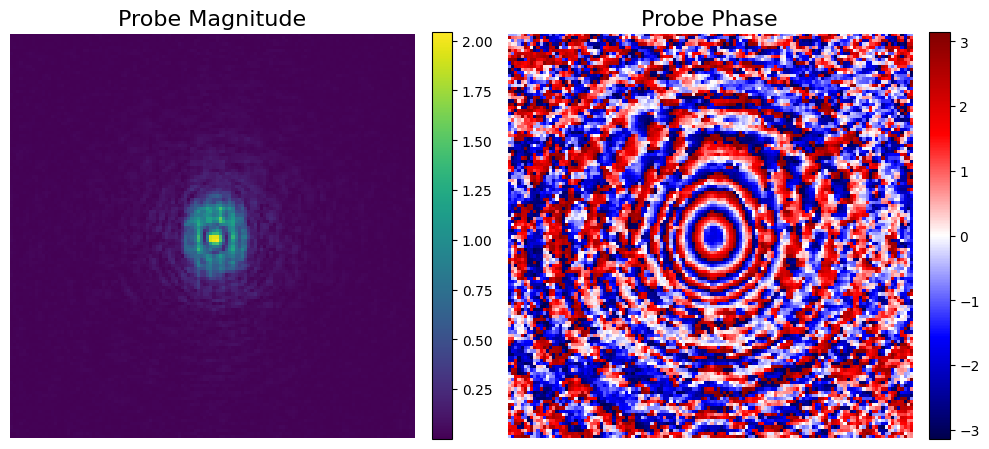

In [4]:
# Compute magnitude and phase
magnitude = np.abs(real_probe)
phase = np.angle(real_probe)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

ax = axes[0]
im0 = ax.imshow(magnitude, cmap='viridis')
ax.set_title('Probe Magnitude', fontsize = 16)
ax.axis('off')
plt.colorbar(im0, ax=ax, fraction=0.046, pad=0.04)

ax = axes[1]
im1 = ax.imshow(phase, cmap='seismic')
ax.set_title('Probe Phase', fontsize = 16)
ax.axis('off')
plt.colorbar(im1, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
#plt.savefig('probe_mag_phase.png', dpi=120, bbox_inches='tight')
plt.show()

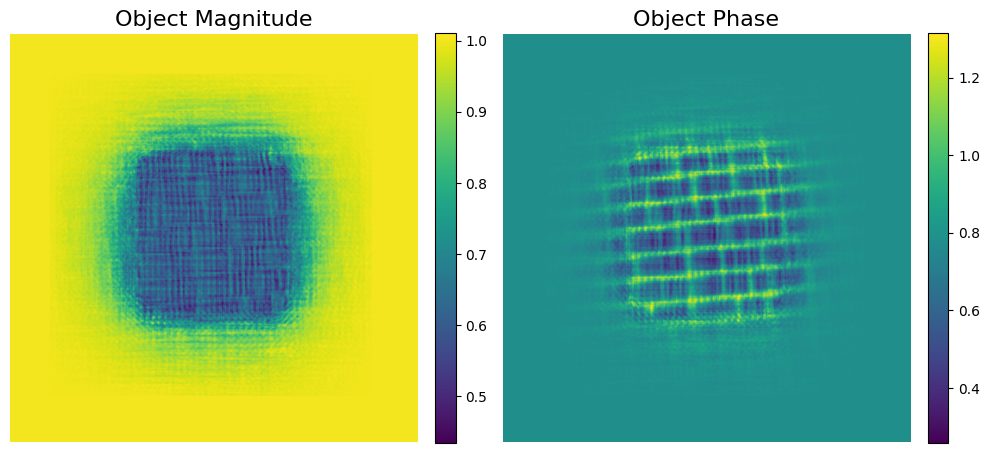

In [5]:
magnitude = np.abs(real_object)
phase = np.angle(real_object)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

ax = axes[0]
im0 = ax.imshow(magnitude, cmap='viridis')
ax.set_title('Object Magnitude', fontsize = 16)
ax.axis('off')
plt.colorbar(im0, ax=ax, fraction=0.046, pad=0.04)

ax = axes[1]
im1 = ax.imshow(phase, cmap='viridis')
ax.set_title('Object Phase', fontsize = 16)
ax.axis('off')
plt.colorbar(im1, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
#plt.savefig('realistic_object.png', dpi=120, bbox_inches='tight')
plt.show()

## Data Generation

In [9]:
# Choose Object
probe = real_probe
ground_truth = real_object

# Probe shift for intensity measurement
shift_o50 = 64
shift_o75 = 32

# Define scanning positions
pos_array_o50 = generate_scanning_positions(object_shape, n_probe, shift_o50)
pos_array_o75 = generate_scanning_positions(object_shape, n_probe, shift_o75)

# Noise added to the measurement
noise_level = 0.05

# Generate the data
data_o50 = generate_intensity_measurements(ground_truth, probe, pos_array_o50, noise_level)
data_o75 = generate_intensity_measurements(ground_truth, probe, pos_array_o75, noise_level)


# Numerical examples

In [12]:
misfit = feasibility_distance_misfit
z_initial = np.ones_like(ground_truth)
num_iterations = 1000
alpha_rpie_o50 = 0.03
tol_o50 = 3e-5
alpha_rpie_o75 = 0.06
tol_o75 = 6e-5
print('The maximum level for MAGPIE is:', int(np.log2(probe.shape[0])))


The maximum level for MAGPIE is: 7


In [13]:
s = time.time()
z_recon_rPIE_o50, res_rPIE_o50, errors_rPIE_o50 = rpie(z_initial, probe, data_o50, pos_array_o50, 
                                                num_iterations, misfit, ground_truth,
                                                alpha = alpha_rpie_o50, metric = True, tol = tol_o50)
print(time.time()-s)


Iteration: 0, f: 271.5088534713276, g: 0.016151692084620892, error: 87.00475602839605
Iteration: 1, f: 22.377767397181998, g: 0.002370837226948428, error: 78.6808202988681
Iteration: 2, f: 10.920982643747827, g: 0.0008788708704724552, error: 76.09275144559712
Iteration: 3, f: 8.223441825430042, g: 0.0005259441600721803, error: 74.32451584396834
Iteration: 4, f: 6.894690274264752, g: 0.0003746210779982845, error: 72.8832778639939
Iteration: 5, f: 6.039775583266744, g: 0.00029802175129719306, error: 71.63410134457138
Iteration: 6, f: 5.4176471142945966, g: 0.0002509550948566853, error: 70.51722996075341
Iteration: 7, f: 4.933931028561706, g: 0.0002199261723588425, error: 69.499442927702
Iteration: 8, f: 4.542391965059812, g: 0.0001966832999278431, error: 68.5601848888939
Iteration: 9, f: 4.216518783671683, g: 0.0001784232240798298, error: 67.68521344352104
Iteration: 10, f: 3.9397820864843465, g: 0.00016427916715871962, error: 66.86431610129335
Iteration: 11, f: 3.701001310263305, g: 0.0

Iteration: 93, f: 0.6712796862345454, g: 4.047346687297792e-05, error: 41.25239630034956
Iteration: 94, f: 0.6648129016960461, g: 4.0337462777691314e-05, error: 41.10434651616574
Iteration: 95, f: 0.6584686208438116, g: 3.987915488068177e-05, error: 40.95785073720957
Iteration: 96, f: 0.6522490409061636, g: 3.9441405576439435e-05, error: 40.812886217043435
Iteration: 97, f: 0.6461665080140794, g: 3.956448364618844e-05, error: 40.66941191885749
Iteration: 98, f: 0.6401903625697926, g: 3.918619806794023e-05, error: 40.52744352129594
Iteration: 99, f: 0.634336436075445, g: 3.895986693436047e-05, error: 40.38691594729855
Iteration: 100, f: 0.6285987658199652, g: 3.88584651900114e-05, error: 40.247766172539954
Iteration: 101, f: 0.6229670428001426, g: 3.8875780892182565e-05, error: 40.110040211787336
Iteration: 102, f: 0.6174381141930482, g: 3.842358569293682e-05, error: 39.97372827411288
Iteration: 103, f: 0.6120185964091006, g: 3.8327032079957384e-05, error: 39.83874066868565
Iteration: 1

Iteration: 184, f: 0.367419758788722, g: 3.081594882152587e-05, error: 32.002897491006706
Iteration: 185, f: 0.3657550483273285, g: 3.078451156503414e-05, error: 31.932942185366507
Iteration: 186, f: 0.36409941935899076, g: 3.0421519158855017e-05, error: 31.863441784605744
Iteration: 187, f: 0.36247592024610115, g: 3.055079477111755e-05, error: 31.79439355613285
Iteration: 188, f: 0.36085762309407504, g: 3.0306050442481732e-05, error: 31.725846142208113
Iteration: 189, f: 0.3592637655489292, g: 3.0241780675006486e-05, error: 31.657692183701364
Iteration: 190, f: 0.35768332770790773, g: 3.001138428686305e-05, error: 31.590037416208858
Iteration: 191, f: 0.35612551377554874, g: 3.017613379229388e-05, error: 31.52280425419892
Iteration: 192, f: 0.3545844054224045, g: 3.0112609034381882e-05, error: 31.456002161977096
Iteration: 193, f: 0.3530579830920263, g: 2.9864884376090112e-05, error: 31.38965379643506
83.66148710250854


In [14]:
s = time.time()
z_recon_rPIE_o75, res_rPIE_o75, errors_rPIE_o75 = rpie(z_initial, probe, data_o75, pos_array_o75, 
                                                num_iterations, misfit, ground_truth,
                                                alpha = alpha_rpie_o75, metric = True, tol = tol_o75)
print(time.time()-s)

Iteration: 0, f: 1170.8650757596834, g: 0.01953269334892377, error: 87.00475602839605
Iteration: 1, f: 119.92321495506577, g: 0.0038625792486824033, error: 59.483784584305305
Iteration: 2, f: 41.501683921771324, g: 0.0014348140312401192, error: 51.67352931193064
Iteration: 3, f: 24.88881131548457, g: 0.0007987746621600893, error: 47.453651266182824
Iteration: 4, f: 18.32856607561881, g: 0.0005339742365132669, error: 44.46505482977422
Iteration: 5, f: 14.770326484605892, g: 0.00040389048179953447, error: 42.096781637968704
Iteration: 6, f: 12.477579423425304, g: 0.0003329771370014752, error: 40.112047202079744
Iteration: 7, f: 10.841535315129589, g: 0.00028803182791726335, error: 38.392455718376915
Iteration: 8, f: 9.598276412735856, g: 0.00025714895716514197, error: 36.867864163918945
Iteration: 9, f: 8.613787777594053, g: 0.00023387534737681382, error: 35.49549052345419
Iteration: 10, f: 7.812248929294225, g: 0.00021571430796365015, error: 34.24581152706999
Iteration: 11, f: 7.1453117

In [15]:
s = time.time()
z_recon_MAGPIE_o50, res_MAGPIE_o50, errors_MAGPIE_o50 = magpie_loop(z_initial, probe, data_o50, pos_array_o50, 
                                                   num_iterations, misfit, ground_truth,
                                                   alpha = alpha_rpie_o50, metric = True, tol = tol_o50, 
                                                   max_level = int(np.log2(probe.shape[0])))
print(time.time()-s)


Iteration: 0, f: 271.5088534713276, g: 0.016151692084620892, error: 87.00475602839605
Iteration: 1, f: 5.72648296246548, g: 0.0008433665547266929, error: 57.605369973801366
Iteration: 2, f: 3.426073327326816, g: 0.00041189724277103867, error: 51.12118975015797
Iteration: 3, f: 2.503840606205909, g: 0.00027533161425845977, error: 46.36923004394425
Iteration: 4, f: 1.980305750003408, g: 0.00021205323687273708, error: 42.59628362939958
Iteration: 5, f: 1.6377711204058891, g: 0.0001862328203578073, error: 39.47010510958037
Iteration: 6, f: 1.3919643460623248, g: 0.00015846698312277973, error: 36.82387551188513
Iteration: 7, f: 1.2090722702774983, g: 0.00013783924408107009, error: 34.549860061579494
Iteration: 8, f: 1.0680034916607435, g: 0.0001254856194660916, error: 32.56447087870958
Iteration: 9, f: 0.9565135133301698, g: 0.00011408424107270644, error: 30.8196605787164
Iteration: 10, f: 0.8665145526369772, g: 0.00010123962746185237, error: 29.27391649764356
Iteration: 11, f: 0.7927577477

Iteration: 91, f: 0.20977193642801703, g: 3.0444250661573287e-05, error: 10.353256803172108
Iteration: 92, f: 0.20900071705498527, g: 3.020180141614288e-05, error: 10.336743425148187
Iteration: 93, f: 0.20824122797137173, g: 3.018472703842262e-05, error: 10.320847893400973
Iteration: 94, f: 0.207506130197829, g: 3.0195027583880826e-05, error: 10.305839926325426
Iteration: 95, f: 0.20677252014412228, g: 2.9795637329505155e-05, error: 10.292018724176755
41.04932880401611


In [16]:
s = time.time()
z_recon_MAGPIE_o75, res_MAGPIE_o75, errors_MAGPIE_o75 = magpie_loop(z_initial, probe, data_o75, pos_array_o75, 
                                                   num_iterations, misfit, ground_truth,
                                                   alpha = alpha_rpie_o75, metric = True, tol = tol_o75, 
                                                   max_level = int(np.log2(probe.shape[0])))
print(time.time()-s)


Iteration: 0, f: 1170.8650757596834, g: 0.01953269334892377, error: 87.00475602839605
Iteration: 1, f: 17.2206285521174, g: 0.0018535889829785735, error: 15.187152724306703
Iteration: 2, f: 5.040062733141861, g: 0.00047705501072996606, error: 12.85018819770639
Iteration: 3, f: 3.527834431083989, g: 0.0003079658604322314, error: 11.212936968027105
Iteration: 4, f: 2.7985821730334814, g: 0.00022812943005829273, error: 10.099696963777056
Iteration: 5, f: 2.37097584999595, g: 0.00018654064947455407, error: 9.252727958905124
Iteration: 6, f: 2.088648879446514, g: 0.0001616719314610368, error: 8.571096074636559
Iteration: 7, f: 1.8865991338998598, g: 0.00014363640598340536, error: 8.009073100142732
Iteration: 8, f: 1.7348280268058487, g: 0.00012941769412392758, error: 7.536340792818563
Iteration: 9, f: 1.6176604555730671, g: 0.00011987278811621437, error: 7.121119066545571
Iteration: 10, f: 1.5239623248384435, g: 0.00011073142588317305, error: 6.760316465216306
Iteration: 11, f: 1.4485793397

In [17]:
s = time.time()
z_initial = np.ones_like(ground_truth)
zstar_o50, error_f_LBFGS_o50, eval_history_LBFGS_o50 = lbfgs(z_initial, probe, data_o50, pos_array_o50, 
                                                   num_iterations, misfit, ground_truth, tol = tol_o50)
print(time.time()-s)

Iter 1, f = 129.24965737301937, g = 0.012489006061154946, Func Evals = 2, Error = 83.54178198471693
Iter 2, f = 49.41534289861009, g = 0.004129681374150709, Func Evals = 3, Error = 82.90269509883709
Iter 3, f = 31.176126075883786, g = 0.002405012471043085, Func Evals = 4, Error = 82.18049176395033
Iter 4, f = 23.492984491242016, g = 0.001971305664616074, Func Evals = 5, Error = 81.53176822286053
Iter 5, f = 16.92231265488509, g = 0.0021829305230231344, Func Evals = 6, Error = 80.19009522937309
Iter 6, f = 14.454078725631472, g = 0.001784125083780995, Func Evals = 7, Error = 79.50993212056999
Iter 7, f = 12.990069770212441, g = 0.0009228521973064417, Func Evals = 8, Error = 79.40818718705198
Iter 8, f = 11.395939817744935, g = 0.0007027167619217251, Func Evals = 9, Error = 78.74842243462234
Iter 9, f = 10.033316390912661, g = 0.0005975561311406443, Func Evals = 10, Error = 77.79382220945753
Iter 10, f = 8.662127859457666, g = 0.0008541870592153911, Func Evals = 11, Error = 76.3543269512

Iter 81, f = 0.47545993642691226, g = 5.888608156600714e-05, Func Evals = 82, Error = 33.11808785503552
Iter 82, f = 0.46489576126721577, g = 8.847128319467909e-05, Func Evals = 83, Error = 32.73384664893573
Iter 83, f = 0.4553034506871462, g = 6.871681512243962e-05, Func Evals = 84, Error = 32.477397803599764
Iter 84, f = 0.44930832215224376, g = 5.577962112797015e-05, Func Evals = 85, Error = 32.47754194973961
Iter 85, f = 0.4404694761288648, g = 6.185814141558609e-05, Func Evals = 86, Error = 32.265654420904184
Iter 86, f = 0.4327362959846333, g = 6.552105000689024e-05, Func Evals = 87, Error = 31.962658641278182
Iter 87, f = 0.42686888609612567, g = 6.205878127513242e-05, Func Evals = 88, Error = 31.752326483798708
Iter 88, f = 0.4196370574826312, g = 4.9590525862654445e-05, Func Evals = 89, Error = 31.447296636926453
Iter 89, f = 0.4128301069841804, g = 7.120121469887746e-05, Func Evals = 90, Error = 31.16263185740607
Iter 90, f = 0.4062183591052806, g = 6.682760872082353e-05, Fun

In [18]:
s = time.time()
z_initial = np.ones_like(ground_truth)
zstar_o75, error_f_LBFGS_o75, eval_history_LBFGS_o75 = lbfgs(z_initial, probe, data_o75, pos_array_o75, 
                                                   num_iterations, misfit, ground_truth, tol = tol_o75)
print(time.time()-s)

Iter 1, f = 533.4962322026394, g = 0.014650993728396016, Func Evals = 2, Error = 71.20324104078385
Iter 2, f = 189.18661411222206, g = 0.004990312823367604, Func Evals = 3, Error = 68.31239588677585
Iter 3, f = 109.49545575697458, g = 0.002834867598727245, Func Evals = 4, Error = 65.03481808644037
Iter 4, f = 77.7952842199327, g = 0.0022782910521408047, Func Evals = 5, Error = 62.39877361362357
Iter 5, f = 50.929331791261674, g = 0.002717640294249323, Func Evals = 6, Error = 57.07948776307301
Iter 6, f = 39.563290482765964, g = 0.0019098824407810956, Func Evals = 7, Error = 55.00014711365638
Iter 7, f = 34.03860889951331, g = 0.0010827316681818527, Func Evals = 8, Error = 54.58702116967697
Iter 8, f = 27.279761315192868, g = 0.0007410597687894207, Func Evals = 9, Error = 52.1209723704481
Iter 9, f = 22.38576701047336, g = 0.0007017645996952689, Func Evals = 10, Error = 49.126681961239306
Iter 10, f = 18.39998533115501, g = 0.0007874460208784977, Func Evals = 11, Error = 45.936358011995

In [19]:
res_f_LBFGS_o75 = eval_history_LBFGS_o75['f']
errors_LBFGS_o75 = eval_history_LBFGS_o75['error']
res_f_LBFGS_o50 = eval_history_LBFGS_o50['f']
errors_LBFGS_o50 = eval_history_LBFGS_o50['error']

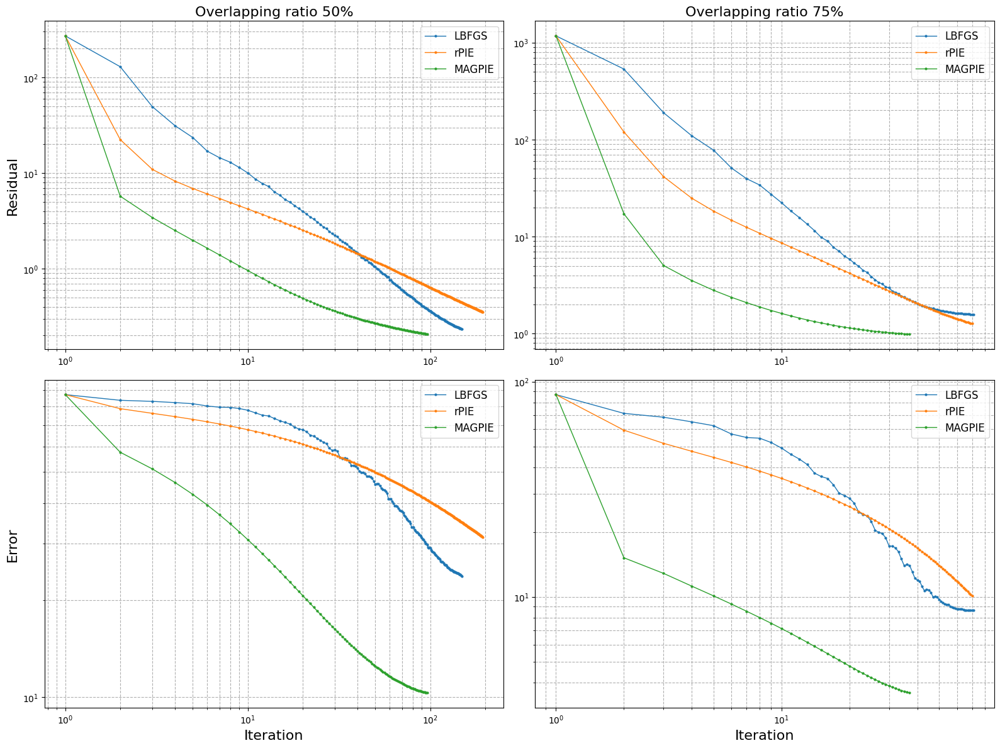

In [20]:
# Create a 2x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

# A helper function to plot one subfigure
def plot_subfigure(ax, res_lbfgs, res_rpie, res_mgrpie, noise_level, xlabel = True, ylabel = True):
    # Create x-values from 1 to the length of the residual arrays
    x_lbfgs = np.arange(1, len(res_lbfgs) + 1)
    x_rpie   = np.arange(1, len(res_rpie) + 1)
    x_mgrpie = np.arange(1, len(res_mgrpie) + 1)
    
    # Plot each method's residuals
    ax.plot(x_lbfgs, res_lbfgs, label='LBFGS', linestyle='-', marker='o', linewidth=1, markersize=2)
    ax.plot(x_rpie, res_rpie, label='rPIE', linestyle='-', marker='o', linewidth=1, markersize=2)
    ax.plot(x_mgrpie, res_mgrpie, label='MAGPIE', linestyle='-', marker='o', linewidth=1, markersize=2)
    
    # Set plot properties
    if xlabel:
        ax.set_xlabel('Iteration', fontsize=16)
    if ylabel == 1:
        ax.set_ylabel('Residual', fontsize=16)
    if ylabel == 2:
        ax.set_ylabel('Error', fontsize=16)
    if noise_level:
        ax.set_title(f'Overlapping ratio {noise_level}%', fontsize=16)
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.legend(fontsize=12)
    ax.grid(True, which="both", ls="--")

# Assign each subplot to the corresponding noise level
plot_subfigure(axes[0, 0], res_f_LBFGS_o50, res_rPIE_o50, res_MAGPIE_o50,  noise_level=50, xlabel = False, ylabel = 1)
plot_subfigure(axes[0, 1], res_f_LBFGS_o75, res_rPIE_o75, res_MAGPIE_o75, noise_level=75, xlabel = False, ylabel = False)
plot_subfigure(axes[1, 0], errors_LBFGS_o50, errors_rPIE_o50, errors_MAGPIE_o50,  noise_level=None, ylabel = 2)
plot_subfigure(axes[1, 1], errors_LBFGS_o75, errors_rPIE_o75, errors_MAGPIE_o75,  noise_level=None, ylabel = False)
               

plt.tight_layout()
#plt.savefig('metric_4.png', dpi=120, bbox_inches='tight')
plt.show()


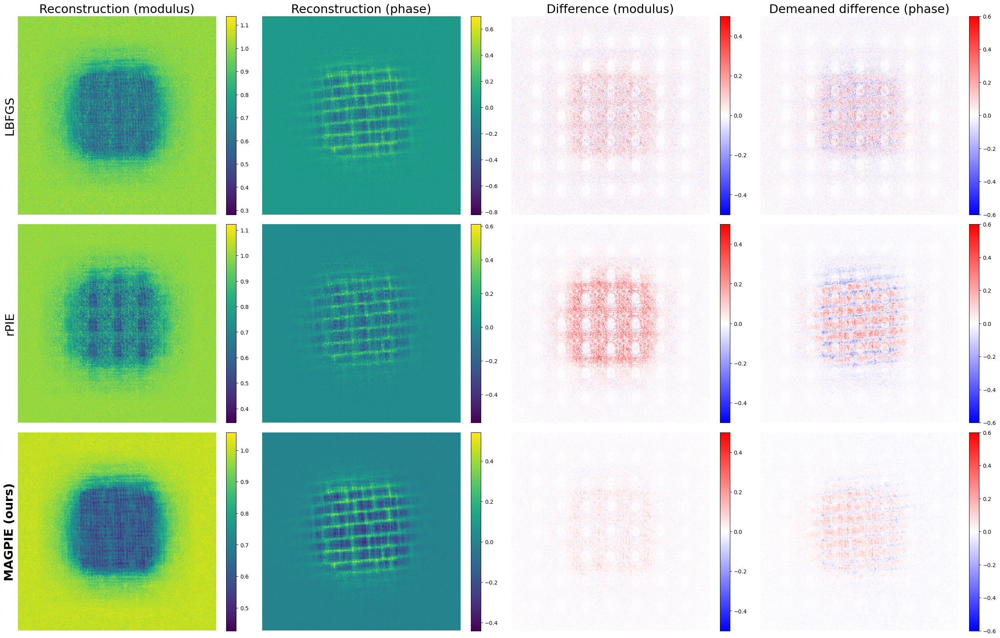

In [25]:
size = object_shape
rPIE_image = z_recon_rPIE_o50
MGrPIE_image = z_recon_MAGPIE_o50
LBFGS_image = zstar_o50.view(np.complex128).reshape(object_shape)
ground_truth = real_object

intensity_ground_truth = np.abs(ground_truth)
phase_ground_truth = np.angle(ground_truth)

def calculate_difference(image, ground_truth):
    intensity_diff = np.abs(image) - intensity_ground_truth
    phase_diff = np.angle(image) - phase_ground_truth - np.mean(np.angle(image) - phase_ground_truth)
    return intensity_diff, phase_diff

intensity_LBFGS, phase_LBFGS = np.abs(LBFGS_image), np.angle(LBFGS_image)
intensity_rPIE, phase_rPIE = np.abs(rPIE_image), np.angle(rPIE_image)
intensity_MGrPIE, phase_MGrPIE = np.abs(MGrPIE_image), np.angle(MGrPIE_image)

# Calculate differences
intensity_diff_LBFGS, phase_diff_LBFGS = calculate_difference(LBFGS_image, ground_truth)
intensity_diff_rPIE, phase_diff_rPIE = calculate_difference(rPIE_image, ground_truth)
intensity_diff_MGrPIE, phase_diff_MGrPIE = calculate_difference(MGrPIE_image, ground_truth)

# Updated column titles and row labels
column_titles = [
    "Reconstruction (modulus)", 
    "Reconstruction (phase)", 
    "Difference (modulus)", 
    "Demeaned difference (phase)"
]
row_labels = ["LBFGS", "rPIE", "MAGPIE (ours)"]

# Prepare data for plotting: each tuple contains (intensity, phase, intensity_diff, phase_diff)
image_data = [
    (intensity_LBFGS, phase_LBFGS, intensity_diff_LBFGS, phase_diff_LBFGS),
    (intensity_rPIE, phase_rPIE, intensity_diff_rPIE, phase_diff_rPIE),
    (intensity_MGrPIE, phase_MGrPIE, intensity_diff_MGrPIE, phase_diff_MGrPIE),
]

# Create a new figure using subplots (no gridspec needed)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(25, 16), constrained_layout=True)

# Set column titles on the first row.
for j, title in enumerate(column_titles):
    axes[0, j].set_title(title, fontsize=22)

# Loop over each row of image data.
for i, (intensity, phase, intensity_diff, phase_diff) in enumerate(image_data):
    # Set the row label for the first column.
    if i == 2:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22, fontweight='bold')
    else:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22)

    # Remove spines and ticks for clarity.
    for j in range(4):
        ax = axes[i, j]
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

    # Plot the intensity image.
    im0 = axes[i, 0].imshow(intensity, cmap='viridis')
    fig.colorbar(im0, ax=axes[i, 0])

    # Plot the phase image.
    im1 = axes[i, 1].imshow(phase, cmap='viridis')
    fig.colorbar(im1, ax=axes[i, 1])
    
    # Plot the intensity difference image with symmetric scaling.
    max_intensity_diff = np.max(np.abs(intensity_diff))
    im2 = axes[i, 2].imshow(intensity_diff, cmap='bwr', vmin=-0.5, vmax=0.5)
    fig.colorbar(im2, ax=axes[i, 2])

    # Plot the phase difference image with symmetric scaling.
    max_phase_diff = np.max(np.abs(phase_diff))
    im3 = axes[i, 3].imshow(phase_diff, cmap='bwr', vmin=-0.6, vmax=0.6)
    fig.colorbar(im3, ax=axes[i, 3])

#plt.savefig('reconstruction_4_50.png', dpi=60, bbox_inches='tight')
plt.show()

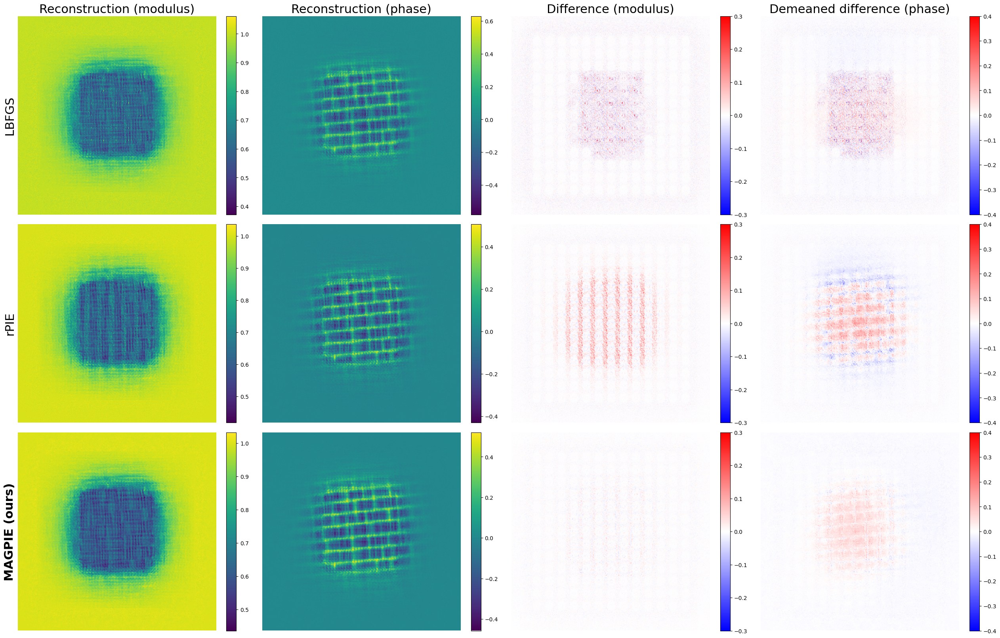

In [24]:
size = object_shape
rPIE_image = z_recon_rPIE_o75
MGrPIE_image = z_recon_MAGPIE_o75
LBFGS_image = zstar_o75.view(np.complex128).reshape(object_shape)
ground_truth = ground_truth

intensity_ground_truth = np.abs(ground_truth)
phase_ground_truth = np.angle(ground_truth)

def calculate_difference(image, ground_truth):
    intensity_diff = np.abs(image) - intensity_ground_truth
    phase_diff = np.angle(image) - phase_ground_truth - np.mean(np.angle(image) - phase_ground_truth)
    return intensity_diff, phase_diff

intensity_LBFGS, phase_LBFGS = np.abs(LBFGS_image), np.angle(LBFGS_image)
intensity_rPIE, phase_rPIE = np.abs(rPIE_image), np.angle(rPIE_image)
intensity_MGrPIE, phase_MGrPIE = np.abs(MGrPIE_image), np.angle(MGrPIE_image)

# Calculate differences
intensity_diff_LBFGS, phase_diff_LBFGS = calculate_difference(LBFGS_image, ground_truth)
intensity_diff_rPIE, phase_diff_rPIE = calculate_difference(rPIE_image, ground_truth)
intensity_diff_MGrPIE, phase_diff_MGrPIE = calculate_difference(MGrPIE_image, ground_truth)

# Updated column titles and row labels
column_titles = [
    "Reconstruction (modulus)", 
    "Reconstruction (phase)", 
    "Difference (modulus)", 
    "Demeaned difference (phase)"
]
row_labels = ["LBFGS", "rPIE", "MAGPIE (ours)"]

# Prepare data for plotting: each tuple contains (intensity, phase, intensity_diff, phase_diff)
image_data = [
    (intensity_LBFGS, phase_LBFGS, intensity_diff_LBFGS, phase_diff_LBFGS),
    (intensity_rPIE, phase_rPIE, intensity_diff_rPIE, phase_diff_rPIE),
    (intensity_MGrPIE, phase_MGrPIE, intensity_diff_MGrPIE, phase_diff_MGrPIE),
]

# Create a new figure using subplots (no gridspec needed)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(25, 16), constrained_layout=True)

# Set column titles on the first row.
for j, title in enumerate(column_titles):
    axes[0, j].set_title(title, fontsize=22)

# Loop over each row of image data.
for i, (intensity, phase, intensity_diff, phase_diff) in enumerate(image_data):
    # Set the row label for the first column.
    if i == 2:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22, fontweight='bold')
    else:
        axes[i, 0].set_ylabel(row_labels[i], fontsize=22)

    # Remove spines and ticks for clarity.
    for j in range(4):
        ax = axes[i, j]
        for spine in ax.spines.values():
            spine.set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

    # Plot the intensity image.
    im0 = axes[i, 0].imshow(intensity, cmap='viridis')
    fig.colorbar(im0, ax=axes[i, 0])

    # Plot the phase image.
    im1 = axes[i, 1].imshow(phase, cmap='viridis')
    fig.colorbar(im1, ax=axes[i, 1])
    
    # Plot the intensity difference image with symmetric scaling.
    max_intensity_diff = np.max(np.abs(intensity_diff))
    im2 = axes[i, 2].imshow(intensity_diff, cmap='bwr', vmin=-0.3, vmax=0.3)
    fig.colorbar(im2, ax=axes[i, 2])

    # Plot the phase difference image with symmetric scaling.
    max_phase_diff = np.max(np.abs(phase_diff))
    im3 = axes[i, 3].imshow(phase_diff, cmap='bwr', vmin=-0.4, vmax=0.4)
    fig.colorbar(im3, ax=axes[i, 3])

#plt.savefig('reconstruction_4_75.png', dpi=60, bbox_inches='tight')
plt.show()